!pip install large-image[all] --find-links https://girder.github.io/large_image_wheels
!pip install histomicstk --find-links https://girder.github.io/large_image_wheels

from google.colab import drive

#Mount the Drive
drive.mount('/content/gdrive')

In [1]:
import os
import zipfile
import numpy as np
import large_image
import matplotlib.pyplot as plt

%matplotlib inline

```python 
zip_url = "/content/gdrive/My Drive/Histopathology/Copy of patient_074.zip"
zip_ref = zipfile.ZipFile(zip_url, 'r')
x=zip_ref.namelist()
print("List of all WSI images present inside ths ZIP:")
x ```



```python 
# Create a Directory to Store the sample images
Data_dir_path = './Data'
os.mkdir(Data_dir_path)```

```python 
# Extract one image
# zip_ref.extract('patient_074_node_0.tif','./Data')
zip_ref.extractall("./Data")
zip_ref.close()
```

In [2]:
wsi_img = large_image.getTileSource('./Data/patient_074_node_4.tif')

Created LRU Cache for 'tilesource' with 40 maximum size
Using python for large_image caching


In [3]:
wsi_img.getMetadata()

{'levels': 10,
 'sizeX': 94968,
 'sizeY': 210579,
 'tileWidth': 512,
 'tileHeight': 512,
 'magnification': 41.136382812499996,
 'mm_x': 0.00024309380933126983,
 'mm_y': 0.00024309380933126983}

In [0]:
# Get the magnification associated with all levels of the image pyramid
for i in range(wsi_img.levels):
    print('Level-{} : {}'.format(
        i, wsi_img.getMagnificationForLevel(level=i)))

Level-0 : {'magnification': 0.08034449768066405, 'mm_x': 0.12446403037761015, 'mm_y': 0.12446403037761015, 'scale': 512.0, 'level': 0}
Level-1 : {'magnification': 0.1606889953613281, 'mm_x': 0.06223201518880508, 'mm_y': 0.06223201518880508, 'scale': 256.0, 'level': 1}
Level-2 : {'magnification': 0.3213779907226562, 'mm_x': 0.03111600759440254, 'mm_y': 0.03111600759440254, 'scale': 128.0, 'level': 2}
Level-3 : {'magnification': 0.6427559814453124, 'mm_x': 0.01555800379720127, 'mm_y': 0.01555800379720127, 'scale': 64.0, 'level': 3}
Level-4 : {'magnification': 1.2855119628906249, 'mm_x': 0.007779001898600635, 'mm_y': 0.007779001898600635, 'scale': 32.0, 'level': 4}
Level-5 : {'magnification': 2.5710239257812497, 'mm_x': 0.0038895009493003173, 'mm_y': 0.0038895009493003173, 'scale': 16.0, 'level': 5}
Level-6 : {'magnification': 5.142047851562499, 'mm_x': 0.0019447504746501587, 'mm_y': 0.0019447504746501587, 'scale': 8.0, 'level': 6}
Level-7 : {'magnification': 10.284095703124999, 'mm_x': 0

(411, 185, 3)


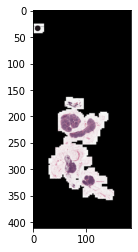

In [4]:
# Visualizing Level-0
tile_info = wsi_img.getSingleTile(
    scale=dict(magnification=0.08034449768066405)
)
print(tile_info['tile'].shape)
plt.imshow(tile_info['tile'])

(500, 500, 3)


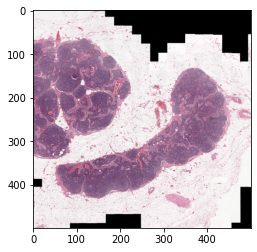

In [5]:
# Visualizing Level-1
pos = 10
tile_info = wsi_img.getSingleTile(
    tile_size=dict(width=500, height=500),
    scale=dict(magnification=0.6427559814453124),
    tile_position=pos
)
print(tile_info['tile'].shape)
plt.imshow(tile_info['tile'])

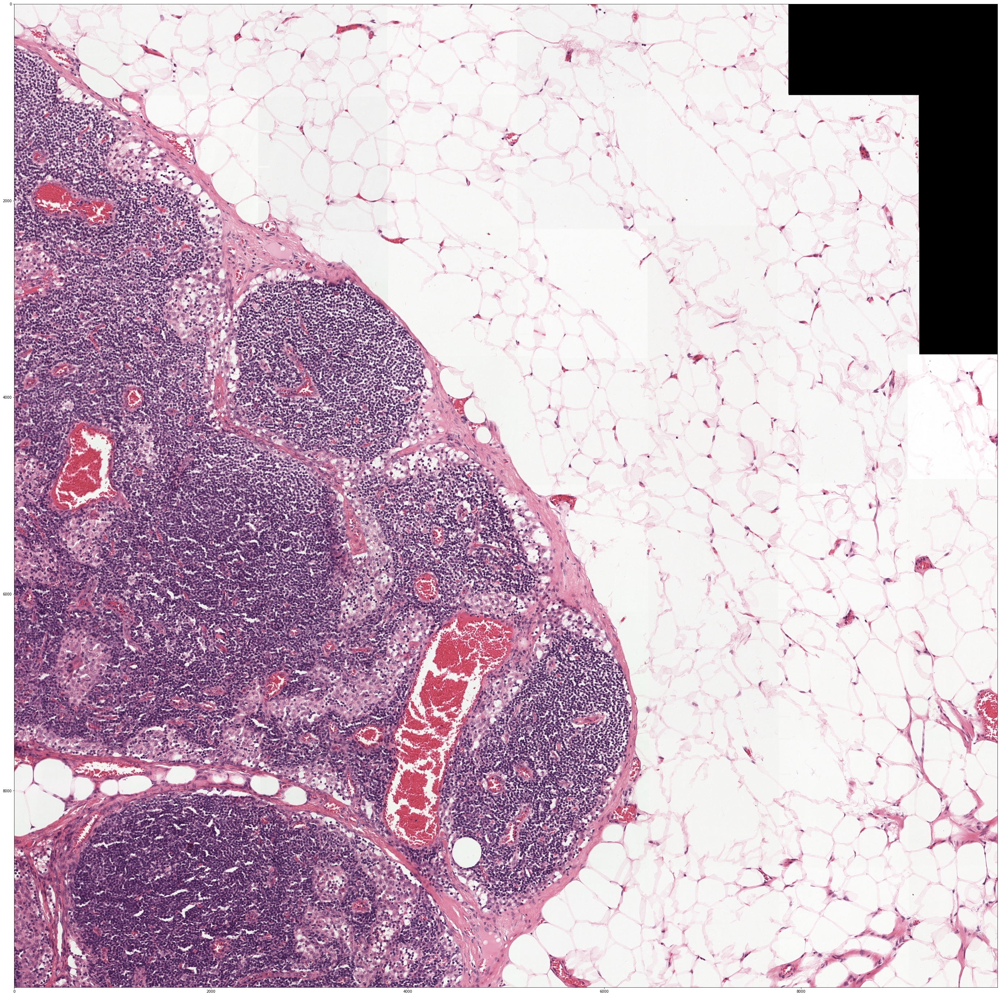

In [6]:
im_roi, _ = wsi_img.getRegion(
    region=dict(left=40000, top=100000, width=10000, height=10000, units='base_pixels'),
    format=large_image.tilesource.TILE_FORMAT_NUMPY
)
plt.figure(figsize=(50,50))
plt.imshow(im_roi)

In [ ]:

im_low_res, _ = wsi_img.getRegion(
    scale=dict(magnification=4),
    format=large_image.tilesource.TILE_FORMAT_NUMPY
)
plt.figure(figsize=(50,50))
plt.imshow(im_low_res)